In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd

import matplotlib.pyplot as plt
import seaborn as sns

import folium

import plotly
import plotly.offline as py
import plotly.graph_objs as go
import plotly_express as px

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [2]:
df = pd.read_json("yelp_academic_dataset_business.json", lines=True)
df

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,6iYb2HFDywm3zjuRg0shjw,Oskar Blues Taproom,921 Pearl St,Boulder,CO,80302,40.017544,-105.283348,4.0,86,1,"{'RestaurantsTableService': 'True', 'WiFi': 'u...","Gastropubs, Food, Beer Gardens, Restaurants, B...","{'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'..."
1,tCbdrRPZA0oiIYSmHG3J0w,Flying Elephants at PDX,7000 NE Airport Way,Portland,OR,97218,45.588906,-122.593331,4.0,126,1,"{'RestaurantsTakeOut': 'True', 'RestaurantsAtt...","Salad, Soup, Sandwiches, Delis, Restaurants, C...","{'Monday': '5:0-18:0', 'Tuesday': '5:0-17:0', ..."
2,bvN78flM8NLprQ1a1y5dRg,The Reclaimory,4720 Hawthorne Ave,Portland,OR,97214,45.511907,-122.613693,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Antiques, Fashion, Used, Vintage & Consignment...","{'Thursday': '11:0-18:0', 'Friday': '11:0-18:0..."
3,oaepsyvc0J17qwi8cfrOWg,Great Clips,2566 Enterprise Rd,Orange City,FL,32763,28.914482,-81.295979,3.0,8,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Beauty & Spas, Hair Salons",None
4,PE9uqAjdw0E4-8mjGl3wVA,Crossfit Terminus,1046 Memorial Dr SE,Atlanta,GA,30316,33.747027,-84.353424,4.0,14,1,"{'GoodForKids': 'False', 'BusinessParking': '{...","Gyms, Active Life, Interval Training Gyms, Fit...","{'Monday': '16:0-19:0', 'Tuesday': '16:0-19:0'..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160580,D2mHoIDXx9N8mS1pGoKV9Q,Eleven Oaks Realty,,Austin,TX,78701,30.272921,-97.744386,4.0,8,1,None,"Real Estate, Real Estate Services, Home Servic...","{'Monday': '9:0-19:0', 'Tuesday': '9:0-19:0', ..."
160581,bQX-kwVTyZgcdZGEPzce6Q,Webb's Honey,21777 State Rd 520,Orlando,FL,32833,28.499836,-81.047478,4.5,18,1,"{'RestaurantsTakeOut': 'True', 'RestaurantsPri...","Health Markets, Food, Specialty Food, Grocery","{'Monday': '10:0-18:0', 'Tuesday': '10:0-18:0'..."
160582,wvFZ06nmPmQ2-IVoPqVYLA,Painting with a Twist,2164 S Chickasaw Trl,Orlando,FL,32825,28.511615,-81.270020,5.0,8,0,"{'DogsAllowed': 'False', 'ByAppointmentOnly': ...","Arts & Entertainment, Paint & Sip, Art Classes...","{'Monday': '0:0-0:0', 'Wednesday': '12:0-17:0'..."
160583,GB75wPibj3IjNauaoCxyGA,Havana Cafe,910 NW 14th St,Portland,OR,97209,45.529647,-122.685153,4.0,10,1,"{'RestaurantsTakeOut': 'True', 'RestaurantsDel...","Cuban, Sandwiches, Restaurants, Cafes",None


In [3]:
df['Restaurants'] = df['categories'].str.contains('Restaurants')
df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants
0,6iYb2HFDywm3zjuRg0shjw,Oskar Blues Taproom,921 Pearl St,Boulder,CO,80302,40.017544,-105.283348,4.0,86,1,"{'RestaurantsTableService': 'True', 'WiFi': 'u...","Gastropubs, Food, Beer Gardens, Restaurants, B...","{'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'...",True
1,tCbdrRPZA0oiIYSmHG3J0w,Flying Elephants at PDX,7000 NE Airport Way,Portland,OR,97218,45.588906,-122.593331,4.0,126,1,"{'RestaurantsTakeOut': 'True', 'RestaurantsAtt...","Salad, Soup, Sandwiches, Delis, Restaurants, C...","{'Monday': '5:0-18:0', 'Tuesday': '5:0-17:0', ...",True
2,bvN78flM8NLprQ1a1y5dRg,The Reclaimory,4720 Hawthorne Ave,Portland,OR,97214,45.511907,-122.613693,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Antiques, Fashion, Used, Vintage & Consignment...","{'Thursday': '11:0-18:0', 'Friday': '11:0-18:0...",False
3,oaepsyvc0J17qwi8cfrOWg,Great Clips,2566 Enterprise Rd,Orange City,FL,32763,28.914482,-81.295979,3.0,8,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Beauty & Spas, Hair Salons",None,False
4,PE9uqAjdw0E4-8mjGl3wVA,Crossfit Terminus,1046 Memorial Dr SE,Atlanta,GA,30316,33.747027,-84.353424,4.0,14,1,"{'GoodForKids': 'False', 'BusinessParking': '{...","Gyms, Active Life, Interval Training Gyms, Fit...","{'Monday': '16:0-19:0', 'Tuesday': '16:0-19:0'...",False


In [4]:
df_restaurants = df.loc[df.Restaurants == True]
df_restaurants

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants
0,6iYb2HFDywm3zjuRg0shjw,Oskar Blues Taproom,921 Pearl St,Boulder,CO,80302,40.017544,-105.283348,4.0,86,1,"{'RestaurantsTableService': 'True', 'WiFi': 'u...","Gastropubs, Food, Beer Gardens, Restaurants, B...","{'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'...",True
1,tCbdrRPZA0oiIYSmHG3J0w,Flying Elephants at PDX,7000 NE Airport Way,Portland,OR,97218,45.588906,-122.593331,4.0,126,1,"{'RestaurantsTakeOut': 'True', 'RestaurantsAtt...","Salad, Soup, Sandwiches, Delis, Restaurants, C...","{'Monday': '5:0-18:0', 'Tuesday': '5:0-17:0', ...",True
5,D4JtQNTI4X3KcbzacDJsMw,Bob Likes Thai Food,3755 Main St,Vancouver,BC,V5V,49.251342,-123.101333,3.5,169,1,"{'GoodForKids': 'True', 'Alcohol': 'u'none'', ...","Restaurants, Thai","{'Monday': '17:0-21:0', 'Tuesday': '17:0-21:0'...",True
7,jFYIsSb7r1QeESVUnXPHBw,Boxwood Biscuit,740 S High St,Columbus,OH,43206,39.947007,-82.997471,4.5,11,1,None,"Breakfast & Brunch, Restaurants","{'Saturday': '8:0-14:0', 'Sunday': '8:0-14:0'}",True
12,HPA_qyMEddpAEtFof02ixg,Mr G's Pizza & Subs,474 Lowell St,Peabody,MA,01960,42.541155,-70.973438,4.0,39,1,"{'RestaurantsGoodForGroups': 'True', 'HasTV': ...","Food, Pizza, Restaurants","{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160573,Zl6SUy6x9jqjRu2HbtEO6A,Split Dine and Drink,7335 SW Bridgeport Rd,Tigard,OR,97224,45.394457,-122.752535,2.0,48,0,"{'RestaurantsDelivery': 'False', 'GoodForKids'...","American (Traditional), Desserts, American (Ne...","{'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'...",True
160574,Q78fYV6B6P6GmX07YVgi4g,Maudie’s Hill Country,12506 Shops Pkwy,Bee Cave,TX,78738,30.304761,-97.937394,3.0,310,1,"{'BusinessParking': '{'garage': False, 'street...","Mexican, Bars, Nightlife, Tex-Mex, Restaurants","{'Monday': '0:0-0:0', 'Tuesday': '9:0-21:0', '...",True
160575,uXdQkuEtvLAzfc3MsO-sTQ,Mama's Cocina Latina,1958 Piedmont Rd NE,Atlanta,GA,30324,33.810996,-84.367084,3.0,185,1,"{'WiFi': 'u'no'', 'BusinessAcceptsCreditCards'...","Restaurants, Mexican, Latin American","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W...",True
160583,GB75wPibj3IjNauaoCxyGA,Havana Cafe,910 NW 14th St,Portland,OR,97209,45.529647,-122.685153,4.0,10,1,"{'RestaurantsTakeOut': 'True', 'RestaurantsDel...","Cuban, Sandwiches, Restaurants, Cafes",None,True


In [5]:
df_restaurants.shape

(50763, 15)

C:\Users\nic\anaconda3\envs\debanjalienv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



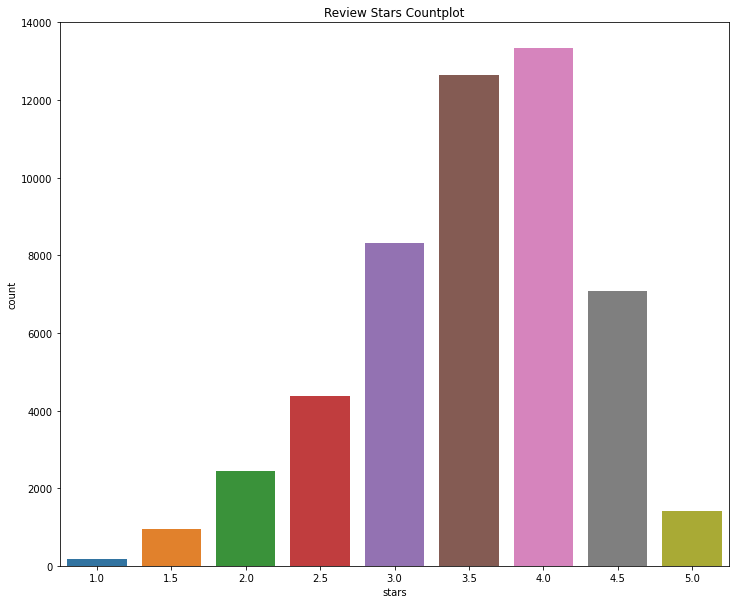

In [6]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(df_restaurants['stars'], ax=ax)
plt.title('Review Stars Countplot')
plt.savefig('stars.png')
plt.show()

In [7]:
top_restaurants = df_restaurants.sort_values(by=['review_count', 'stars'], ascending=False)[:20]
top_restaurants.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants
64048,4CxF8c3MB7VAdY8zFb2cZQ,Voodoo Doughnut - Old Town,22 SW 3rd Ave,Portland,OR,97204,45.522612,-122.673084,3.5,9185,1,"{'RestaurantsPriceRange2': '1', 'BikeParking':...","Local Flavor, Food, Donuts, Wedding Chapels, E...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-21:0', '...",True
113608,PrsvO1rzkgg6qFizlAoEtg,Mike's Pastry,300 Hanover St,Boston,MA,02113,42.364181,-71.054218,4.0,7298,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Candy Stores, Gelato, Food, Coffee & Tea, Rest...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ...",True
42375,OQ2oHkcWA8KNC1Lsvj1SBA,Screen Door,2337 E Burnside St,Portland,OR,97214,45.523086,-122.641680,4.5,7219,1,"{'RestaurantsPriceRange2': '2', 'BusinessAccep...","Caterers, Restaurants, Breakfast & Brunch, Sou...","{'Monday': '11:0-20:0', 'Tuesday': '11:0-20:0'...",True
25571,zioLxtBc9THNS2TOn9xW1w,Pok Pok,3226 SE Division St,Portland,OR,97202,45.504723,-122.632105,4.0,6221,0,"{'BusinessParking': '{'garage': False, 'street...","Restaurants, Asian Fusion, Pan Asian, Thai, Fi...","{'Monday': '11:30-22:0', 'Tuesday': '11:30-22:...",True
145385,y2w6rFaO0XEiG5mFfOsiFA,Neptune Oyster,63 Salem St,Boston,MA,02113,42.363237,-71.055975,4.5,5115,1,"{'NoiseLevel': 'u'average'', 'RestaurantsAttir...","Arabian, Thai, American (Traditional), Live/Ra...","{'Monday': '11:30-21:30', 'Tuesday': '11:30-21...",True


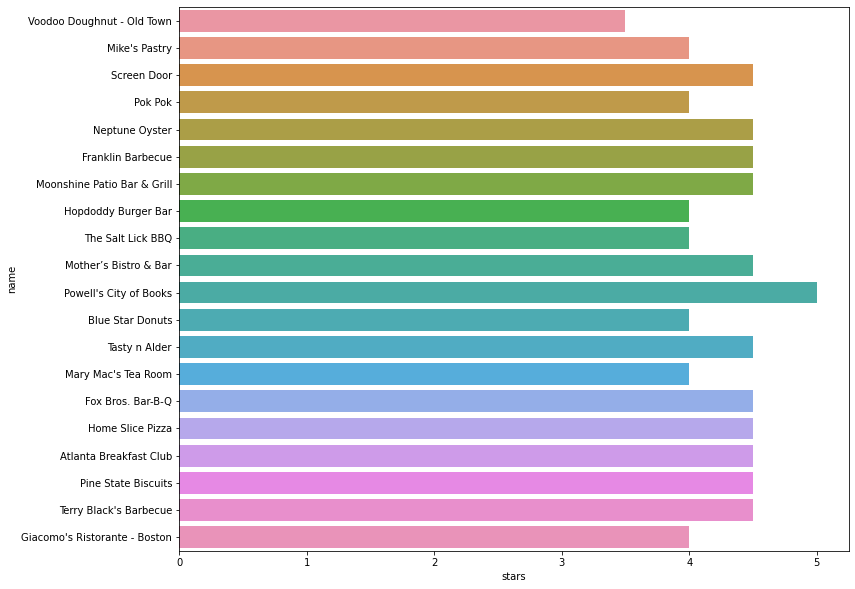

In [8]:
fig, ax = plt.subplots(figsize=(12,10))
sns.barplot(x = 'stars', y = 'name', data=top_restaurants, ax= ax);
plt.savefig('top20_restaurants.png')
plt.show()

In [9]:
px.set_mapbox_access_token("pk.eyJ1Ijoic2hha2Fzb20iLCJhIjoiY2plMWg1NGFpMXZ5NjJxbjhlM2ttN3AwbiJ9.RtGYHmreKiyBfHuElgYq_w")
#configure_plotly_browser_state()
px.scatter_mapbox(df_restaurants, lat="latitude", lon="longitude", color="stars", size='review_count' ,
                   size_max=30, zoom=3, width=1200, height=800)


In [10]:
Portland = df_restaurants[df_restaurants.state == 'OR']
px.scatter_mapbox(Portland, lat="latitude", lon="longitude", color="stars", size='review_count' ,
                   size_max=15, zoom=10, width=1200, height=800)

In [11]:
# Elbow method to determine the number of K in Kmeans Clustering
coords = Portland[['longitude','latitude']]

distortions = []
K = range(1,25)
for k in K:
    kmeansModel = KMeans(n_clusters=k)
    kmeansModel = kmeansModel.fit(coords)
    distortions.append(kmeansModel.inertia_)

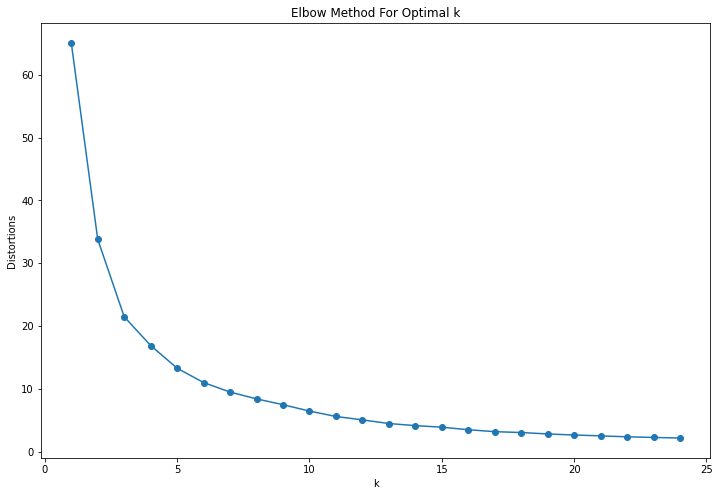

In [12]:
fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(K, distortions, marker='o')
plt.xlabel('k')
plt.ylabel('Distortions')
plt.title('Elbow Method For Optimal k')
plt.savefig('elbow.png')
plt.show()


In [13]:
# Silhoute method

from sklearn.metrics import silhouette_score

sil = []
kmax = 50

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
  kmeans = KMeans(n_clusters = k).fit(coords)
  labels = kmeans.labels_
  sil.append(silhouette_score(coords, labels, metric = 'euclidean'))

In [14]:
sil

[0.5334054997642641,
 0.47744494066207643,
 0.4776138791607374,
 0.4682868606927395,
 0.38706011371721377,
 0.41095570818348814,
 0.41755226722260647,
 0.4236739513933872,
 0.42998586361051794,
 0.4341955836749873,
 0.44587821253768706,
 0.46085056374362643,
 0.45375907105504204,
 0.47180615955796984,
 0.4714401271946691,
 0.47099838742265593,
 0.46616319687708935,
 0.4682760941431753,
 0.46687934051758156,
 0.46034102762635953,
 0.45105426936567383,
 0.4509148576674569,
 0.4521273674414114,
 0.4659422242762127,
 0.45439802734652684,
 0.45727711279861066,
 0.4589468688828172,
 0.45651483451551667,
 0.4542609777532471,
 0.4686467986442044,
 0.470218644008399,
 0.47845565048016875,
 0.4671871974348412,
 0.47484730823977567,
 0.48138994422645626,
 0.47384175765566394,
 0.4781914909640182,
 0.4824722179304068,
 0.4757042714976441,
 0.4895958659001989,
 0.4833836296952978,
 0.48573421428566227,
 0.45460442692661185,
 0.4897742783690473,
 0.4860477055851917,
 0.4851980069201074,
 0.484758300

In [15]:
# performing k-means clustering
kmeans = KMeans(n_clusters=5, init='k-means++')
kmeans.fit(coords)
y = kmeans.labels_
print("k = 5", " silhouette_score ", silhouette_score(coords, y, metric='euclidean'))

k = 5  silhouette_score  0.4673184023805836


In [16]:
Portland['cluster'] = kmeans.predict(Portland[['longitude','latitude']])
Portland.head()

<ipython-input-16-1d399121fbfc>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants,cluster
1,tCbdrRPZA0oiIYSmHG3J0w,Flying Elephants at PDX,7000 NE Airport Way,Portland,OR,97218,45.588906,-122.593331,4.0,126,1,"{'RestaurantsTakeOut': 'True', 'RestaurantsAtt...","Salad, Soup, Sandwiches, Delis, Restaurants, C...","{'Monday': '5:0-18:0', 'Tuesday': '5:0-17:0', ...",True,0
36,jx91IMdGOmLOo8h_F9z39g,Cleary's Restaurant & Spirits,12429 NE Glisan St,Portland,OR,97230,45.526473,-122.535323,3.5,19,1,"{'RestaurantsGoodForGroups': 'True', 'Alcohol'...","Nightlife, Sandwiches, Seafood, Restaurants","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",True,0
50,5PsApTz-WqhF_-8mfqGtGw,Cafe Yumm!,301 SW Morrison St,Portland,OR,97204,45.518450,-122.675723,3.5,158,1,"{'OutdoorSeating': 'True', 'GoodForKids': 'Tru...","Vegetarian, Vegan, Sandwiches, Soup, American ...","{'Monday': '10:0-17:0', 'Tuesday': '10:0-17:0'...",True,1
93,HMXiuCxHDXqMH1hBpaHd9g,Whole Time Chicken,,Portland,OR,97215,45.516241,-122.597527,5.0,7,0,"{'OutdoorSeating': 'True', 'RestaurantsTableSe...","Food Stands, Restaurants, Sandwiches","{'Monday': '11:0-20:0', 'Tuesday': '11:0-20:0'...",True,0
94,ZA3u0Nu5V6TqkcYh8U0zdg,B Street Coffee House,2190 W Burnside St,Portland,OR,97210,45.523074,-122.696206,4.5,131,0,"{'Caters': 'False', 'RestaurantsAttire': 'u'ca...","Restaurants, Food, Sandwiches, Breakfast & Bru...","{'Monday': '6:30-15:0', 'Tuesday': '6:30-15:0'...",True,1


In [17]:
px.scatter_mapbox(Portland, lat="latitude", lon="longitude", color="cluster", size='review_count', 
                  hover_data= ['name', 'latitude', 'longitude'], zoom=10, width=1200, height=800)

In [18]:
top_restaurants_Portland = Portland.sort_values(by=['review_count', 'stars'], ascending=False)
top_restaurants_Portland.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants,cluster
64048,4CxF8c3MB7VAdY8zFb2cZQ,Voodoo Doughnut - Old Town,22 SW 3rd Ave,Portland,OR,97204,45.522612,-122.673084,3.5,9185,1,"{'RestaurantsPriceRange2': '1', 'BikeParking':...","Local Flavor, Food, Donuts, Wedding Chapels, E...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-21:0', '...",True,1
42375,OQ2oHkcWA8KNC1Lsvj1SBA,Screen Door,2337 E Burnside St,Portland,OR,97214,45.523086,-122.641680,4.5,7219,1,"{'RestaurantsPriceRange2': '2', 'BusinessAccep...","Caterers, Restaurants, Breakfast & Brunch, Sou...","{'Monday': '11:0-20:0', 'Tuesday': '11:0-20:0'...",True,1
25571,zioLxtBc9THNS2TOn9xW1w,Pok Pok,3226 SE Division St,Portland,OR,97202,45.504723,-122.632105,4.0,6221,0,"{'BusinessParking': '{'garage': False, 'street...","Restaurants, Asian Fusion, Pan Asian, Thai, Fi...","{'Monday': '11:30-22:0', 'Tuesday': '11:30-22:...",True,1
122853,n73rxa6e6-fTIxQzfv4BuA,Mother’s Bistro & Bar,121 SW 3rd Ave,Portland,OR,97204,45.522196,-122.673868,4.5,4466,1,"{'RestaurantsGoodForGroups': 'True', 'BYOBCork...","American (Traditional), Restaurants, Bars, Nig...","{'Tuesday': '16:0-20:0', 'Wednesday': '16:0-20...",True,1
27556,OPfgKOm_n-ajUo3qjSEgRg,Powell's City of Books,1005 W Burnside St,Portland,OR,97209,45.523097,-122.681325,5.0,4295,1,"{'BikeParking': 'True', 'RestaurantsPriceRange...","Food, Airports, Bookstores, Flowers & Gifts, C...","{'Monday': '11:0-18:0', 'Tuesday': '11:0-18:0'...",True,1


In [19]:
def recommend_restaurants(df, longitude, latitude):
    # Predict the cluster for longitude and latitude provided
    cluster = kmeans.predict(np.array([longitude,latitude]).reshape(1,-1))[0]
    print(cluster)
   
    # Get the best restaurant in this cluster
    return  df[df['cluster']==cluster].iloc[0:5][['name', 'latitude','longitude'	]]

In [20]:
recommend_restaurants(top_restaurants_Portland,-115.1891691,  36.1017316)

4


,name,latitude,longitude
79159,Bob's Red Mill,45.432601,-122.611290
17071,Stickmen Brewing Company,45.416109,-122.663807
120494,Dave & Buster's,45.434829,-122.574986
107131,Yvonne's,45.358424,-122.606453
80311,The Highland Stillhouse,45.351460,-122.614183


In [21]:
recommend_restaurants(top_restaurants_Portland,-115.2798544, 36.0842838)

4


,name,latitude,longitude
79159,Bob's Red Mill,45.432601,-122.611290
17071,Stickmen Brewing Company,45.416109,-122.663807
120494,Dave & Buster's,45.434829,-122.574986
107131,Yvonne's,45.358424,-122.606453
80311,The Highland Stillhouse,45.351460,-122.614183


In [22]:
recommend_restaurants(top_restaurants_Portland, 	-115.082821, 36.155011 )

4


,name,latitude,longitude
79159,Bob's Red Mill,45.432601,-122.611290
17071,Stickmen Brewing Company,45.416109,-122.663807
120494,Dave & Buster's,45.434829,-122.574986
107131,Yvonne's,45.358424,-122.606453
80311,The Highland Stillhouse,45.351460,-122.614183


In [23]:
test_coordinates = {
    'user': [1, 2, 3], 
    'latitude' : [36.1017316, 36.0842838, 36.155011],
    'longitude' : [-115.1891691, -115.2798544, -115.082821],
}

test_df = pd.DataFrame(test_coordinates)
test_df

,user,latitude,longitude
0,1,36.101732,-115.189169
1,2,36.084284,-115.279854
2,3,36.155011,-115.082821


In [24]:
user1 = test_df[test_df['user'] == 1]
user1

,user,latitude,longitude
0,1,36.101732,-115.189169


In [25]:
fig = px.scatter_mapbox(recommend_restaurants(top_restaurants_Portland, user1.longitude, user1.latitude), lat="latitude", lon="longitude",  
                   zoom=10, width=1200, height=800, hover_data= ['name', 'latitude', 'longitude'])
fig.add_scattermapbox(lat=user1["latitude"], lon= user1["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))

4


In [26]:
user2 = test_df[test_df['user'] == 2].reset_index()
fig = px.scatter_mapbox(recommend_restaurants(top_restaurants_Portland, user2.longitude, user2.latitude), lat="latitude", lon="longitude",  
                   zoom=10, width=1200, height=800, hover_data= ['name', 'latitude', 'longitude'])
fig.add_scattermapbox(lat=user2["latitude"], lon= user2["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))

4


In [27]:
user3 = test_df[test_df['user'] == 2].reset_index()
fig = px.scatter_mapbox(recommend_restaurants(top_restaurants_Portland, user3.longitude, user3.latitude), lat="latitude", lon="longitude",  
                   zoom=10, width=1200, height=800, hover_data= ['name', 'latitude', 'longitude'])
fig.add_scattermapbox(lat=user3["latitude"], lon= user3["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))

4
